<a href="https://colab.research.google.com/github/vladimiralencar/DeepLearning-LANA/blob/master/RNN/GAN_GoogleStreetView.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gerando Imagens a Partir do Google Street View

# Deep Convolutional GANs

Neste Mini-Projeto, você criará um modelo GAN usando camadas convolucionais no gerador e discriminador. Isso é chamado de Deep Convolutional GAN, ou DCGAN. A arquitetura DCGAN tem obtido resultados impressionantes na geração de novas imagens. Você pode ler o [paper original aqui](https://arxiv.org/pdf/1511.06434.pdf).

Você estará treinando o DCGAN no [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. Estas são imagens em cores dos números de casas coletados Google Street View. As imagens SVHN são coloridas e são muito mais variáveis do que o MNIST.

In [0]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [0]:
# Execute apenas na primeira vez que rodar este Jupyter Notebook
!mkdir data

## Gerando os Dados

Download conjunto de dados SVHN. 

In [0]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("O diretório não existe!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve('http://ufldl.stanford.edu/housenumbers/train_32x32.mat', data_dir + 'train_32x32.mat', pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve('http://ufldl.stanford.edu/housenumbers/test_32x32.mat', data_dir + 'test_32x32.mat', pbar.hook)

SVHN Training Set: 182MB [00:20, 8.90MB/s]                            
SVHN Testing Set: 64.3MB [00:07, 8.55MB/s]                            


Os arquivos SVHN são arquivos `.mat` normalmente usados com o Matlab. No entanto, podemos carregá-los com `scipy.io.loadmat` que importamos acima.

In [0]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Vejamos uma pequena amostra das imagens. Cada uma delas é 32x32 com 3 canais de cores (RGB). Estas são as imagens reais que passaremos para o discriminador.

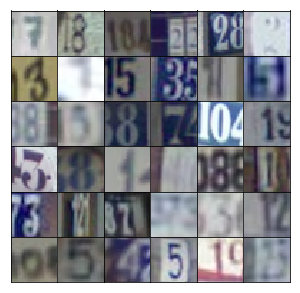

In [0]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Aqui precisamos fazer um pouco de pré-processamento e obter as imagens em uma forma onde podemos passar lotes para a rede. Primeiro, precisamos reiniciar as imagens para um intervalo de -1 a 1, uma vez que a saída do nosso gerador também está nessa faixa. Também temos um conjunto de imagens de teste e validação que podem ser usados se estamos tentando identificar os números nas imagens.

In [0]:
def scale(x, feature_range=(-1, 1)):
    # Scale para (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # Scale para feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [0]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Inputs da Rede

In [0]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Aqui você vai construir a rede do gerador. A entrada será o nosso vetor de ruído `z`. Além disso, a saída será o resultado da função $tanh$, mas desta vez com tamanho 32x32 que é o tamanho das nossas imagens SVHN.

O que há de novo aqui é que usaremos camadas convolutivas para criar nossas novas imagens. A primeira camada é uma camada totalmente conectada, que é remodelada em uma camada profunda e estreita, como 4x4x1024, como no paper DCGAN original. Em seguida, usamos Batch Normalization e uma ativação com Leaky ReLU. Em seguida, é uma convolução transposta.

Você continua empilhando camadas assim, até obter a camada de convolução transposta com a forma 32x32x3. Abaixo está a imagem usada no papel DCGAN original:

![DCGAN Generator](https://github.com/vladimiralencar/DeepLearning-LANA/raw/master/RNN/images/generator.png)

Observe que a camada final aqui é 64x64x3, enquanto que para o nosso conjunto de dados SVHN, queremos que seja 32x32x3.

Nota: Batch Normalization é uma técnica para melhorar o desempenho e a estabilidade das redes neurais. A ideia é normalizar as entradas de camada de modo que tenham uma média igual a zero e variância igual a 1, bem como a forma como padronizamos as entradas para as redes. Batch Normalization é necessária para que os DCGANs funcionem.

In [0]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        
        # Primeira camada totalmente conectada
        x1 = tf.layers.dense(z, 4*4*512)
        
        # Reshape para começar a convolução
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # x1 = 4x4x512 
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # x2 = 8x8x256 
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # x3 = 16x16x128 
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # logits = 32x32x3 
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Aqui você irá construir o discriminador. Isto é basicamente apenas um classificador convolucional como você já construiu antes. A entrada para o discriminador é 32x32x3 tensores / imagens. Você quer algumas camadas convolucionais, então uma camada totalmente conectada para a saída. Queremos uma saída sigmoid, e você também precisará retornar os logits. Para as profundidades das camadas convolucionais, sugiro começar com 16, 32, 64 filtros na primeira camada, depois dobre a profundidade ao adicionar camadas. Note-se que no paper DCGAN, eles fizeram todo o downsampling usando apenas camadas convolucionais com strings sem maxpool.

Você também deseja usar a normalização do lote com `tf.layers.batch_normalization` em cada camada, exceto as primeiras camadas de convolução e saída. Novamente, cada camada deve parecer algo como convolution > batch Norm > Leaky.

Nota: neste projeto, suas camadas de normalização de lote sempre usarão estatísticas de lote. (Isto é, sempre configuramos `training` para` True`.) Isso porque estamos apenas interessados em usar o discriminador para ajudar a formar o gerador. No entanto, se você quisesse usar o discriminador para inferência mais tarde, então você precisaria configurar o parâmetro `training` apropriadamente.

In [0]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer = 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # relu1 = 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # relu2 = 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # relu3 = 4x4x256

        # Flatten 
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Calculando a Perda

In [0]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):

    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Otimização

Não há muito novo aqui, mas observe como as operações do treino estão envolvidas em um bloco `com tf.control_dependencies` para que as camadas de normalização do lote possam atualizar suas estatísticas populacionais.

In [0]:
def model_opt(d_loss, g_loss, learning_rate, beta1):

    # Atualiza pesos e bias
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Otimização
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Construindo o Modelo

Aqui podemos usar as funções que definimos para construir o modelo como uma classe. Isso tornará mais fácil mover a rede em nosso código, uma vez que os nós e as operações no grafo são empacotados em um objeto.

In [0]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z, real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Aqui está uma função para exibir imagens geradas.

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

E outra função que podemos usar para treinar nossa rede. Observe quando chamamos `generator` para criar as amostras para exibir, definimos `training` para `False`. É assim que as camadas de normalização do lote usarão as estatísticas da população em vez das estatísticas do lote. Observe também que definimos o marcador de posição `net.input_real` quando executamos o otimizador do gerador. O gerador na verdade não o usa, mas obteríamos um erro sem ele devido ao bloco `tf.control_dependencies` que criamos no `model_opt`.

In [0]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise para G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # No final de cada época, obtenha as perdas e imprima-as
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Salva as perdas para visualizar após o treinamento
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hiperparâmetros

Os GANs são muito sensíveis aos hiperparâmetros. Muitas experiências tentam encontrar os melhores hiperparâmetros, de modo que o gerador e o discriminador não se dominem mutuamente. Experimente seus próprios hiperparâmetros ou leia [o DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) para ver o que funcionou para eles.

In [0]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Cria a rede
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

In [0]:
dataset = Dataset(trainset, testset)

## Treinamento

Epoch 1/25... Discriminator Loss: 1.4782... Generator Loss: 0.5240
Epoch 1/25... Discriminator Loss: 0.5735... Generator Loss: 1.4619
Epoch 1/25... Discriminator Loss: 0.1953... Generator Loss: 2.3249
Epoch 1/25... Discriminator Loss: 0.1775... Generator Loss: 2.5554
Epoch 1/25... Discriminator Loss: 0.1991... Generator Loss: 2.6117
Epoch 1/25... Discriminator Loss: 0.0894... Generator Loss: 3.1704
Epoch 1/25... Discriminator Loss: 0.1827... Generator Loss: 2.5778
Epoch 1/25... Discriminator Loss: 0.2491... Generator Loss: 2.1669
Epoch 1/25... Discriminator Loss: 0.1217... Generator Loss: 2.9807
Epoch 1/25... Discriminator Loss: 0.2258... Generator Loss: 2.2928


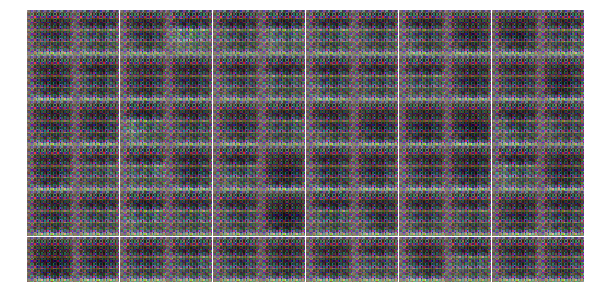

Epoch 1/25... Discriminator Loss: 0.8393... Generator Loss: 1.0891
Epoch 1/25... Discriminator Loss: 0.5832... Generator Loss: 2.1462
Epoch 1/25... Discriminator Loss: 0.6056... Generator Loss: 1.9229
Epoch 1/25... Discriminator Loss: 0.3981... Generator Loss: 1.6965
Epoch 1/25... Discriminator Loss: 0.5591... Generator Loss: 1.4716
Epoch 1/25... Discriminator Loss: 0.4051... Generator Loss: 1.8406
Epoch 1/25... Discriminator Loss: 0.5949... Generator Loss: 1.7302
Epoch 1/25... Discriminator Loss: 0.3368... Generator Loss: 2.1388
Epoch 1/25... Discriminator Loss: 0.9484... Generator Loss: 4.0450
Epoch 1/25... Discriminator Loss: 0.2578... Generator Loss: 1.7982


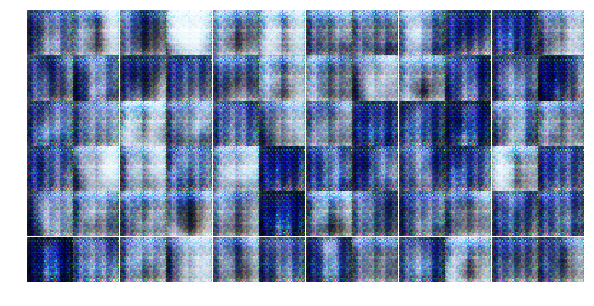

Epoch 1/25... Discriminator Loss: 1.8425... Generator Loss: 0.3010
Epoch 1/25... Discriminator Loss: 0.4088... Generator Loss: 1.3738
Epoch 1/25... Discriminator Loss: 0.3861... Generator Loss: 1.4942
Epoch 1/25... Discriminator Loss: 1.4273... Generator Loss: 0.6288
Epoch 1/25... Discriminator Loss: 1.4119... Generator Loss: 4.2489
Epoch 1/25... Discriminator Loss: 0.7962... Generator Loss: 1.3368
Epoch 1/25... Discriminator Loss: 0.8063... Generator Loss: 0.9667
Epoch 1/25... Discriminator Loss: 0.4285... Generator Loss: 2.0172
Epoch 1/25... Discriminator Loss: 0.9913... Generator Loss: 2.5854
Epoch 1/25... Discriminator Loss: 0.5818... Generator Loss: 1.6912


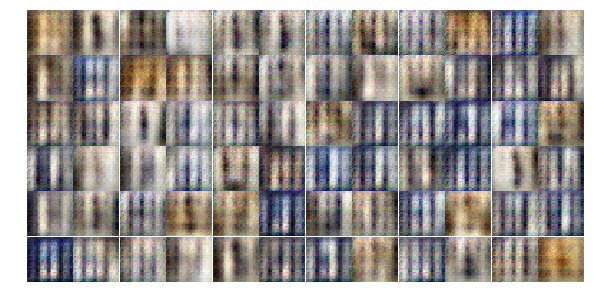

Epoch 1/25... Discriminator Loss: 0.6597... Generator Loss: 1.4233
Epoch 1/25... Discriminator Loss: 0.6459... Generator Loss: 1.3880
Epoch 1/25... Discriminator Loss: 0.4200... Generator Loss: 2.1693
Epoch 1/25... Discriminator Loss: 0.4398... Generator Loss: 1.5811
Epoch 1/25... Discriminator Loss: 0.4408... Generator Loss: 1.7513
Epoch 1/25... Discriminator Loss: 0.7967... Generator Loss: 1.9234
Epoch 1/25... Discriminator Loss: 0.5095... Generator Loss: 1.4566
Epoch 1/25... Discriminator Loss: 0.2354... Generator Loss: 3.1597
Epoch 1/25... Discriminator Loss: 0.8070... Generator Loss: 1.2406
Epoch 1/25... Discriminator Loss: 0.9137... Generator Loss: 3.9028


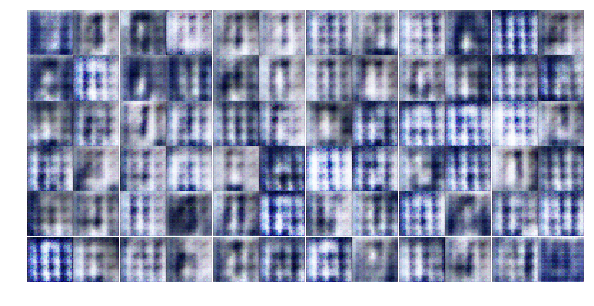

Epoch 1/25... Discriminator Loss: 0.4850... Generator Loss: 1.8261
Epoch 1/25... Discriminator Loss: 0.5509... Generator Loss: 1.4876
Epoch 1/25... Discriminator Loss: 0.4636... Generator Loss: 1.3705
Epoch 1/25... Discriminator Loss: 0.6969... Generator Loss: 1.7989
Epoch 1/25... Discriminator Loss: 0.7186... Generator Loss: 1.0822
Epoch 1/25... Discriminator Loss: 1.1635... Generator Loss: 0.7204
Epoch 1/25... Discriminator Loss: 0.7742... Generator Loss: 1.4416
Epoch 1/25... Discriminator Loss: 1.0276... Generator Loss: 0.8343
Epoch 1/25... Discriminator Loss: 1.0527... Generator Loss: 0.8356
Epoch 1/25... Discriminator Loss: 0.6688... Generator Loss: 2.4712


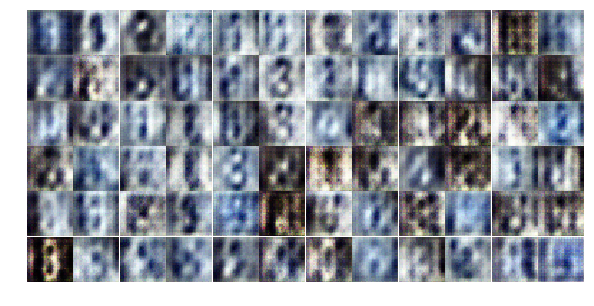

Epoch 1/25... Discriminator Loss: 0.4123... Generator Loss: 1.7932
Epoch 1/25... Discriminator Loss: 0.8131... Generator Loss: 1.2338
Epoch 1/25... Discriminator Loss: 1.0450... Generator Loss: 2.9729
Epoch 1/25... Discriminator Loss: 1.0513... Generator Loss: 0.5851
Epoch 1/25... Discriminator Loss: 0.7616... Generator Loss: 1.2264
Epoch 1/25... Discriminator Loss: 0.9030... Generator Loss: 1.0484
Epoch 1/25... Discriminator Loss: 0.9163... Generator Loss: 1.0068
Epoch 2/25... Discriminator Loss: 0.9504... Generator Loss: 1.0693
Epoch 2/25... Discriminator Loss: 0.6181... Generator Loss: 1.7775
Epoch 2/25... Discriminator Loss: 0.8199... Generator Loss: 1.4145


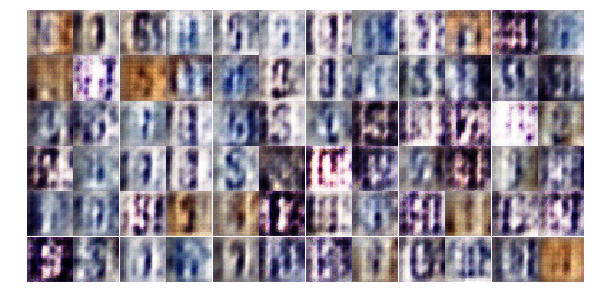

Epoch 2/25... Discriminator Loss: 0.8036... Generator Loss: 1.7520
Epoch 2/25... Discriminator Loss: 1.0719... Generator Loss: 0.7834
Epoch 2/25... Discriminator Loss: 1.1791... Generator Loss: 0.8474
Epoch 2/25... Discriminator Loss: 1.0290... Generator Loss: 1.0899
Epoch 2/25... Discriminator Loss: 1.3776... Generator Loss: 0.6834
Epoch 2/25... Discriminator Loss: 1.1062... Generator Loss: 0.9626
Epoch 2/25... Discriminator Loss: 0.8552... Generator Loss: 1.3602
Epoch 2/25... Discriminator Loss: 1.1779... Generator Loss: 0.9806
Epoch 2/25... Discriminator Loss: 1.2100... Generator Loss: 0.5780
Epoch 2/25... Discriminator Loss: 0.7308... Generator Loss: 1.5331


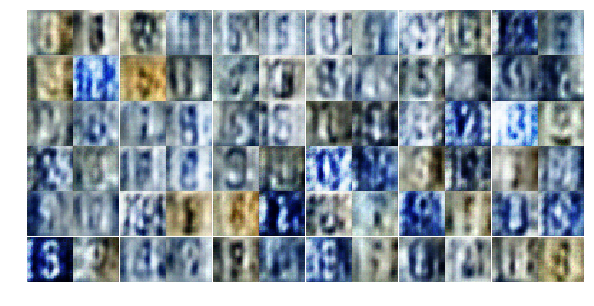

Epoch 2/25... Discriminator Loss: 1.1799... Generator Loss: 1.0996
Epoch 2/25... Discriminator Loss: 0.8706... Generator Loss: 1.2545
Epoch 2/25... Discriminator Loss: 0.9918... Generator Loss: 1.5234
Epoch 2/25... Discriminator Loss: 0.6866... Generator Loss: 1.3185
Epoch 2/25... Discriminator Loss: 1.1499... Generator Loss: 1.4312
Epoch 2/25... Discriminator Loss: 1.1142... Generator Loss: 0.8760
Epoch 2/25... Discriminator Loss: 1.1191... Generator Loss: 0.8646
Epoch 2/25... Discriminator Loss: 1.1034... Generator Loss: 0.9402
Epoch 2/25... Discriminator Loss: 1.0139... Generator Loss: 0.9430
Epoch 2/25... Discriminator Loss: 0.9112... Generator Loss: 0.8431


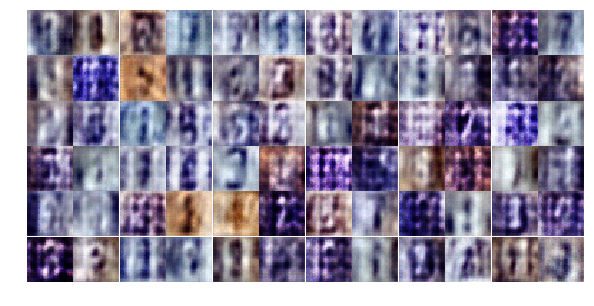

Epoch 2/25... Discriminator Loss: 1.3205... Generator Loss: 0.7965
Epoch 2/25... Discriminator Loss: 1.0076... Generator Loss: 0.9571
Epoch 2/25... Discriminator Loss: 1.3485... Generator Loss: 0.7727
Epoch 2/25... Discriminator Loss: 1.1546... Generator Loss: 1.2780
Epoch 2/25... Discriminator Loss: 0.9811... Generator Loss: 1.0412
Epoch 2/25... Discriminator Loss: 1.6021... Generator Loss: 0.6226
Epoch 2/25... Discriminator Loss: 0.8430... Generator Loss: 1.0080
Epoch 2/25... Discriminator Loss: 1.1518... Generator Loss: 0.9738
Epoch 2/25... Discriminator Loss: 1.1861... Generator Loss: 0.7182
Epoch 2/25... Discriminator Loss: 1.0462... Generator Loss: 0.9455


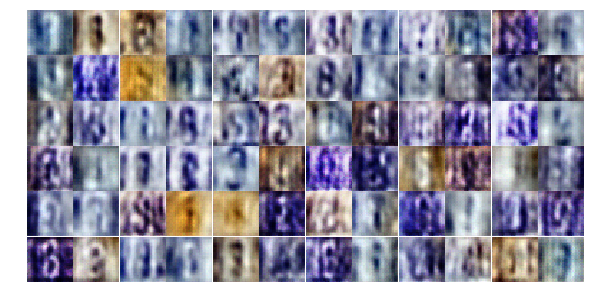

Epoch 2/25... Discriminator Loss: 1.0088... Generator Loss: 0.9887
Epoch 2/25... Discriminator Loss: 0.9292... Generator Loss: 0.9414
Epoch 2/25... Discriminator Loss: 1.3091... Generator Loss: 0.7431
Epoch 2/25... Discriminator Loss: 1.2522... Generator Loss: 0.5898
Epoch 2/25... Discriminator Loss: 1.0277... Generator Loss: 1.3829
Epoch 2/25... Discriminator Loss: 1.3087... Generator Loss: 0.8712
Epoch 2/25... Discriminator Loss: 1.2830... Generator Loss: 0.6960
Epoch 2/25... Discriminator Loss: 0.9348... Generator Loss: 1.4807
Epoch 2/25... Discriminator Loss: 0.9374... Generator Loss: 0.8767
Epoch 2/25... Discriminator Loss: 1.0115... Generator Loss: 1.2183


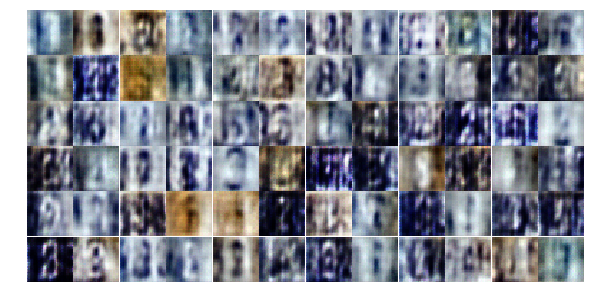

Epoch 2/25... Discriminator Loss: 0.8165... Generator Loss: 1.1241
Epoch 2/25... Discriminator Loss: 1.2706... Generator Loss: 0.7432
Epoch 2/25... Discriminator Loss: 1.3712... Generator Loss: 0.4396
Epoch 2/25... Discriminator Loss: 1.0427... Generator Loss: 0.7324
Epoch 2/25... Discriminator Loss: 1.2988... Generator Loss: 0.5484
Epoch 2/25... Discriminator Loss: 0.9398... Generator Loss: 0.8813
Epoch 2/25... Discriminator Loss: 1.2117... Generator Loss: 2.1810
Epoch 2/25... Discriminator Loss: 0.7730... Generator Loss: 1.3724
Epoch 2/25... Discriminator Loss: 0.7624... Generator Loss: 1.4898
Epoch 2/25... Discriminator Loss: 1.2284... Generator Loss: 0.7301


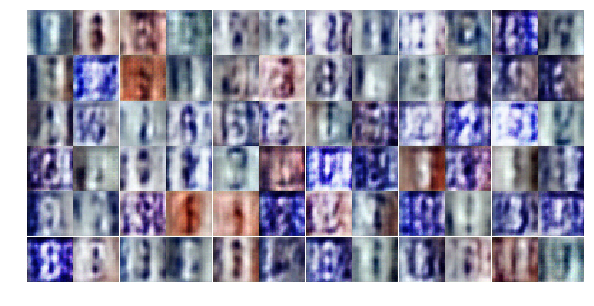

Epoch 2/25... Discriminator Loss: 0.8286... Generator Loss: 1.1188
Epoch 2/25... Discriminator Loss: 0.8704... Generator Loss: 0.8802
Epoch 2/25... Discriminator Loss: 0.6346... Generator Loss: 1.3268
Epoch 2/25... Discriminator Loss: 1.1918... Generator Loss: 1.0730
Epoch 3/25... Discriminator Loss: 0.9577... Generator Loss: 3.2998
Epoch 3/25... Discriminator Loss: 0.8851... Generator Loss: 0.8588
Epoch 3/25... Discriminator Loss: 0.8340... Generator Loss: 1.5179
Epoch 3/25... Discriminator Loss: 0.6808... Generator Loss: 1.2094
Epoch 3/25... Discriminator Loss: 1.0196... Generator Loss: 1.3764
Epoch 3/25... Discriminator Loss: 1.0853... Generator Loss: 0.8905


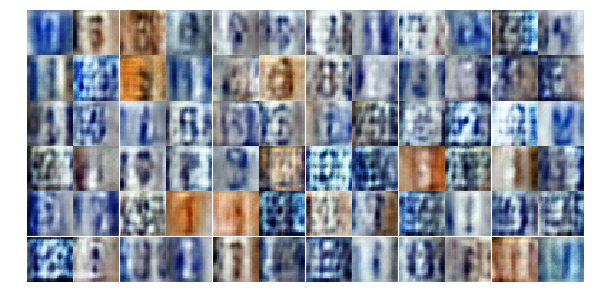

Epoch 3/25... Discriminator Loss: 0.4891... Generator Loss: 2.0833
Epoch 3/25... Discriminator Loss: 0.8439... Generator Loss: 0.8322
Epoch 3/25... Discriminator Loss: 0.7882... Generator Loss: 1.1370
Epoch 3/25... Discriminator Loss: 0.6657... Generator Loss: 1.0778
Epoch 3/25... Discriminator Loss: 0.6389... Generator Loss: 1.0535
Epoch 3/25... Discriminator Loss: 1.5899... Generator Loss: 0.3289
Epoch 3/25... Discriminator Loss: 1.0780... Generator Loss: 1.6063
Epoch 3/25... Discriminator Loss: 0.7731... Generator Loss: 1.8561
Epoch 3/25... Discriminator Loss: 0.7065... Generator Loss: 1.0661
Epoch 3/25... Discriminator Loss: 1.0897... Generator Loss: 0.6334


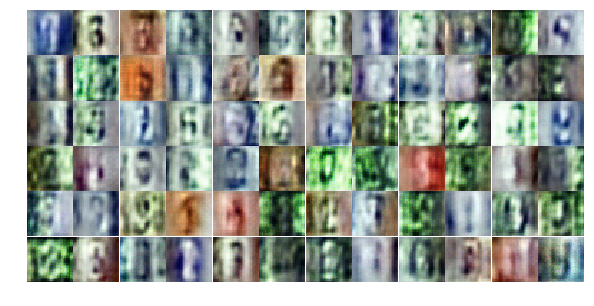

Epoch 3/25... Discriminator Loss: 1.0973... Generator Loss: 0.8540
Epoch 3/25... Discriminator Loss: 0.6361... Generator Loss: 1.3055
Epoch 3/25... Discriminator Loss: 0.8642... Generator Loss: 0.9440
Epoch 3/25... Discriminator Loss: 0.5685... Generator Loss: 1.8425
Epoch 3/25... Discriminator Loss: 0.8595... Generator Loss: 0.8435
Epoch 3/25... Discriminator Loss: 0.7062... Generator Loss: 1.8638
Epoch 3/25... Discriminator Loss: 0.6082... Generator Loss: 1.6964
Epoch 3/25... Discriminator Loss: 0.5834... Generator Loss: 1.5551
Epoch 3/25... Discriminator Loss: 1.0215... Generator Loss: 0.7275
Epoch 3/25... Discriminator Loss: 0.8461... Generator Loss: 0.8462


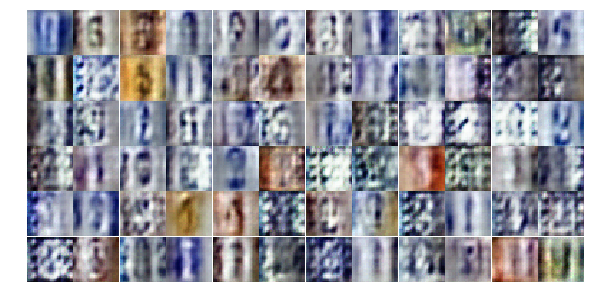

Epoch 3/25... Discriminator Loss: 0.7999... Generator Loss: 1.4610
Epoch 3/25... Discriminator Loss: 0.5929... Generator Loss: 1.3647
Epoch 3/25... Discriminator Loss: 0.7501... Generator Loss: 1.1231
Epoch 3/25... Discriminator Loss: 0.7023... Generator Loss: 2.0716
Epoch 3/25... Discriminator Loss: 0.7350... Generator Loss: 1.9127
Epoch 3/25... Discriminator Loss: 0.7498... Generator Loss: 1.2454
Epoch 3/25... Discriminator Loss: 0.4009... Generator Loss: 1.7778
Epoch 3/25... Discriminator Loss: 1.0816... Generator Loss: 0.6743
Epoch 3/25... Discriminator Loss: 0.7383... Generator Loss: 1.1779
Epoch 3/25... Discriminator Loss: 0.5475... Generator Loss: 1.3823


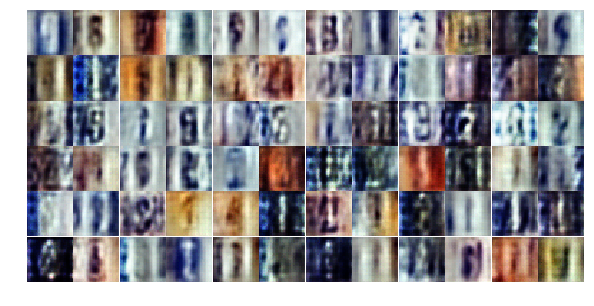

Epoch 3/25... Discriminator Loss: 0.8264... Generator Loss: 2.3132
Epoch 3/25... Discriminator Loss: 0.9330... Generator Loss: 1.3163
Epoch 3/25... Discriminator Loss: 0.6181... Generator Loss: 1.7532
Epoch 3/25... Discriminator Loss: 0.6205... Generator Loss: 1.5764
Epoch 3/25... Discriminator Loss: 0.6299... Generator Loss: 2.2612
Epoch 3/25... Discriminator Loss: 0.6923... Generator Loss: 1.1463
Epoch 3/25... Discriminator Loss: 1.0192... Generator Loss: 0.6943
Epoch 3/25... Discriminator Loss: 0.6973... Generator Loss: 1.0176
Epoch 3/25... Discriminator Loss: 1.0287... Generator Loss: 2.6736
Epoch 3/25... Discriminator Loss: 1.5543... Generator Loss: 0.4608


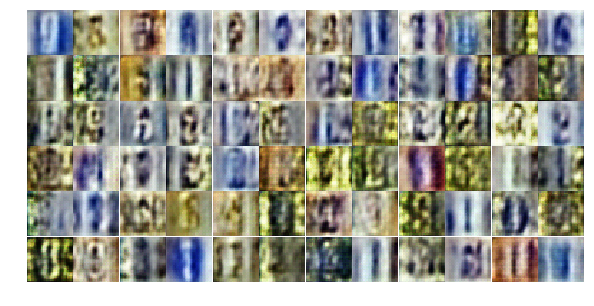

Epoch 3/25... Discriminator Loss: 1.5460... Generator Loss: 3.3013
Epoch 3/25... Discriminator Loss: 0.9849... Generator Loss: 1.6933
Epoch 3/25... Discriminator Loss: 0.8723... Generator Loss: 1.2619
Epoch 3/25... Discriminator Loss: 1.0877... Generator Loss: 0.6671
Epoch 3/25... Discriminator Loss: 0.8916... Generator Loss: 1.2828
Epoch 3/25... Discriminator Loss: 0.3530... Generator Loss: 2.3134
Epoch 3/25... Discriminator Loss: 0.8591... Generator Loss: 1.9383
Epoch 3/25... Discriminator Loss: 0.6717... Generator Loss: 1.4692
Epoch 3/25... Discriminator Loss: 0.7525... Generator Loss: 1.7132
Epoch 3/25... Discriminator Loss: 0.8801... Generator Loss: 0.9377


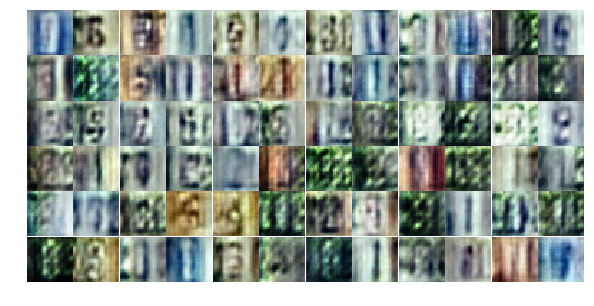

Epoch 3/25... Discriminator Loss: 0.7519... Generator Loss: 0.8775
Epoch 4/25... Discriminator Loss: 0.9179... Generator Loss: 0.7567
Epoch 4/25... Discriminator Loss: 0.9970... Generator Loss: 0.6930
Epoch 4/25... Discriminator Loss: 0.8669... Generator Loss: 0.8927
Epoch 4/25... Discriminator Loss: 0.8982... Generator Loss: 0.7392
Epoch 4/25... Discriminator Loss: 0.8898... Generator Loss: 0.7439
Epoch 4/25... Discriminator Loss: 0.7935... Generator Loss: 1.5968
Epoch 4/25... Discriminator Loss: 0.8585... Generator Loss: 1.6988
Epoch 4/25... Discriminator Loss: 0.5689... Generator Loss: 1.4527
Epoch 4/25... Discriminator Loss: 0.5823... Generator Loss: 1.3445


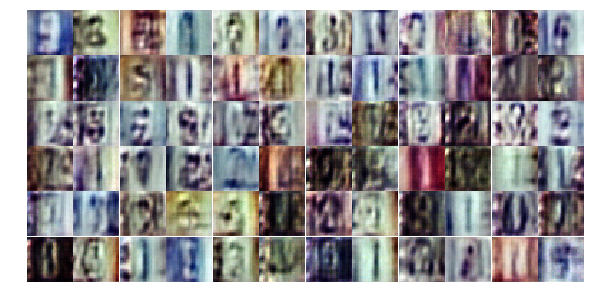

Epoch 4/25... Discriminator Loss: 1.1115... Generator Loss: 0.6069
Epoch 4/25... Discriminator Loss: 0.5602... Generator Loss: 1.2547
Epoch 4/25... Discriminator Loss: 1.2443... Generator Loss: 2.2913
Epoch 4/25... Discriminator Loss: 0.4745... Generator Loss: 2.3806
Epoch 4/25... Discriminator Loss: 0.5190... Generator Loss: 1.6912
Epoch 4/25... Discriminator Loss: 0.7667... Generator Loss: 1.4791
Epoch 4/25... Discriminator Loss: 0.7118... Generator Loss: 1.6480
Epoch 4/25... Discriminator Loss: 0.7217... Generator Loss: 0.9516
Epoch 4/25... Discriminator Loss: 0.9408... Generator Loss: 1.3488
Epoch 4/25... Discriminator Loss: 1.2346... Generator Loss: 2.6833


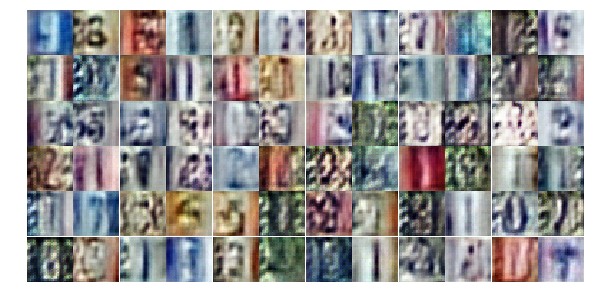

Epoch 4/25... Discriminator Loss: 0.5684... Generator Loss: 2.0648
Epoch 4/25... Discriminator Loss: 0.6318... Generator Loss: 1.1628
Epoch 4/25... Discriminator Loss: 1.2742... Generator Loss: 0.4624
Epoch 4/25... Discriminator Loss: 1.7794... Generator Loss: 0.2636
Epoch 4/25... Discriminator Loss: 0.5656... Generator Loss: 1.3397
Epoch 4/25... Discriminator Loss: 0.4209... Generator Loss: 2.8782
Epoch 4/25... Discriminator Loss: 1.1687... Generator Loss: 1.0035
Epoch 4/25... Discriminator Loss: 0.8132... Generator Loss: 0.8261
Epoch 4/25... Discriminator Loss: 0.5787... Generator Loss: 3.0284
Epoch 4/25... Discriminator Loss: 0.7594... Generator Loss: 0.8889


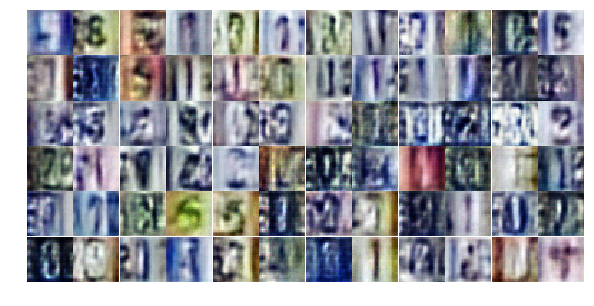

Epoch 4/25... Discriminator Loss: 0.5579... Generator Loss: 1.6797
Epoch 4/25... Discriminator Loss: 0.6310... Generator Loss: 1.1204
Epoch 4/25... Discriminator Loss: 0.5349... Generator Loss: 1.4035
Epoch 4/25... Discriminator Loss: 0.5240... Generator Loss: 1.5205
Epoch 4/25... Discriminator Loss: 0.5286... Generator Loss: 1.4120
Epoch 4/25... Discriminator Loss: 0.5867... Generator Loss: 1.2265
Epoch 4/25... Discriminator Loss: 1.2415... Generator Loss: 0.6341
Epoch 4/25... Discriminator Loss: 0.7179... Generator Loss: 1.7989
Epoch 4/25... Discriminator Loss: 1.4239... Generator Loss: 0.3857
Epoch 4/25... Discriminator Loss: 0.9725... Generator Loss: 0.7326


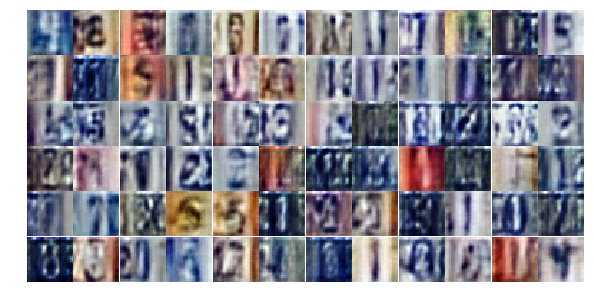

Epoch 4/25... Discriminator Loss: 0.7734... Generator Loss: 0.9702
Epoch 4/25... Discriminator Loss: 0.6708... Generator Loss: 1.0756
Epoch 4/25... Discriminator Loss: 0.4124... Generator Loss: 2.0054
Epoch 4/25... Discriminator Loss: 0.7770... Generator Loss: 0.9279
Epoch 4/25... Discriminator Loss: 0.3124... Generator Loss: 2.0031
Epoch 4/25... Discriminator Loss: 0.6198... Generator Loss: 1.2855
Epoch 4/25... Discriminator Loss: 0.3276... Generator Loss: 2.2153
Epoch 4/25... Discriminator Loss: 0.4447... Generator Loss: 1.8948
Epoch 4/25... Discriminator Loss: 1.3152... Generator Loss: 0.4726
Epoch 4/25... Discriminator Loss: 0.3999... Generator Loss: 1.9103


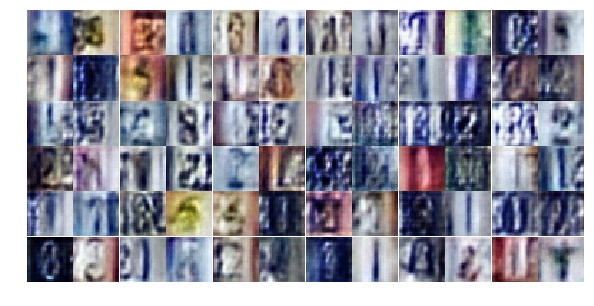

Epoch 4/25... Discriminator Loss: 0.4847... Generator Loss: 1.3442
Epoch 4/25... Discriminator Loss: 0.3791... Generator Loss: 1.6718
Epoch 4/25... Discriminator Loss: 0.5699... Generator Loss: 2.5810
Epoch 4/25... Discriminator Loss: 0.6818... Generator Loss: 1.1096
Epoch 4/25... Discriminator Loss: 1.2381... Generator Loss: 0.7847
Epoch 4/25... Discriminator Loss: 0.8983... Generator Loss: 0.8023
Epoch 4/25... Discriminator Loss: 0.5456... Generator Loss: 1.6339
Epoch 4/25... Discriminator Loss: 0.5991... Generator Loss: 1.2622
Epoch 4/25... Discriminator Loss: 0.8777... Generator Loss: 0.7671
Epoch 5/25... Discriminator Loss: 0.5566... Generator Loss: 1.7152


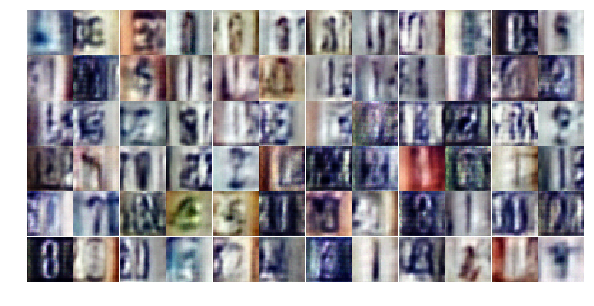

Epoch 5/25... Discriminator Loss: 0.3705... Generator Loss: 2.2176
Epoch 5/25... Discriminator Loss: 0.6309... Generator Loss: 1.1699
Epoch 5/25... Discriminator Loss: 0.9251... Generator Loss: 0.7597
Epoch 5/25... Discriminator Loss: 0.3657... Generator Loss: 2.0445
Epoch 5/25... Discriminator Loss: 0.4503... Generator Loss: 2.5640
Epoch 5/25... Discriminator Loss: 0.7100... Generator Loss: 1.1490
Epoch 5/25... Discriminator Loss: 0.5928... Generator Loss: 1.1239
Epoch 5/25... Discriminator Loss: 0.5206... Generator Loss: 1.8094
Epoch 5/25... Discriminator Loss: 1.2507... Generator Loss: 0.4445
Epoch 5/25... Discriminator Loss: 1.7774... Generator Loss: 0.2966


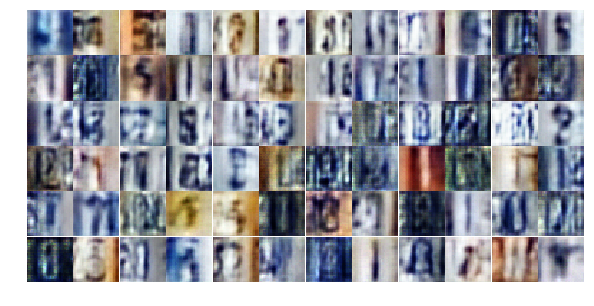

Epoch 5/25... Discriminator Loss: 0.6765... Generator Loss: 1.9532
Epoch 5/25... Discriminator Loss: 0.5593... Generator Loss: 1.4768
Epoch 5/25... Discriminator Loss: 0.6409... Generator Loss: 1.3374
Epoch 5/25... Discriminator Loss: 1.3342... Generator Loss: 0.4745
Epoch 5/25... Discriminator Loss: 0.5019... Generator Loss: 1.8788
Epoch 5/25... Discriminator Loss: 0.5158... Generator Loss: 1.4013
Epoch 5/25... Discriminator Loss: 0.5043... Generator Loss: 1.3767
Epoch 5/25... Discriminator Loss: 0.4999... Generator Loss: 1.5213
Epoch 5/25... Discriminator Loss: 0.3680... Generator Loss: 1.7220
Epoch 5/25... Discriminator Loss: 0.5058... Generator Loss: 1.4300


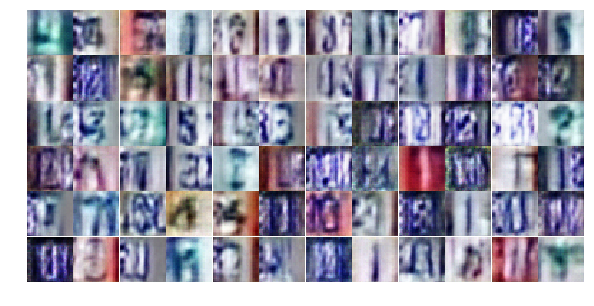

Epoch 5/25... Discriminator Loss: 0.4047... Generator Loss: 1.8137
Epoch 5/25... Discriminator Loss: 1.5707... Generator Loss: 0.3896
Epoch 5/25... Discriminator Loss: 0.4913... Generator Loss: 2.1439
Epoch 5/25... Discriminator Loss: 0.5762... Generator Loss: 1.3372
Epoch 5/25... Discriminator Loss: 1.1079... Generator Loss: 0.5697
Epoch 5/25... Discriminator Loss: 0.7923... Generator Loss: 0.8232
Epoch 5/25... Discriminator Loss: 0.8418... Generator Loss: 0.7368
Epoch 5/25... Discriminator Loss: 0.7680... Generator Loss: 0.9330
Epoch 5/25... Discriminator Loss: 0.7896... Generator Loss: 1.6173
Epoch 5/25... Discriminator Loss: 0.3713... Generator Loss: 1.7909


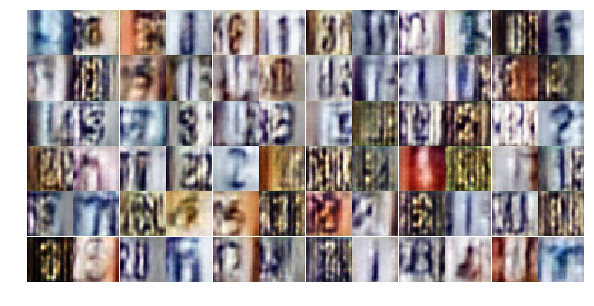

Epoch 5/25... Discriminator Loss: 0.5104... Generator Loss: 2.3908
Epoch 5/25... Discriminator Loss: 0.4387... Generator Loss: 1.7681
Epoch 5/25... Discriminator Loss: 0.4961... Generator Loss: 1.4793
Epoch 5/25... Discriminator Loss: 0.6439... Generator Loss: 1.1255
Epoch 5/25... Discriminator Loss: 1.0423... Generator Loss: 1.1092
Epoch 5/25... Discriminator Loss: 0.7650... Generator Loss: 2.2337
Epoch 5/25... Discriminator Loss: 0.5531... Generator Loss: 1.2422
Epoch 5/25... Discriminator Loss: 0.5921... Generator Loss: 1.2343
Epoch 5/25... Discriminator Loss: 0.4457... Generator Loss: 1.4845
Epoch 5/25... Discriminator Loss: 0.5210... Generator Loss: 1.3259


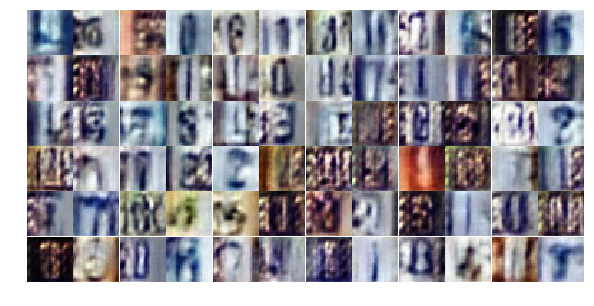

Epoch 5/25... Discriminator Loss: 0.3735... Generator Loss: 2.5912
Epoch 5/25... Discriminator Loss: 0.4555... Generator Loss: 1.3747
Epoch 5/25... Discriminator Loss: 0.7832... Generator Loss: 0.9565
Epoch 5/25... Discriminator Loss: 0.4992... Generator Loss: 2.6685
Epoch 5/25... Discriminator Loss: 0.6737... Generator Loss: 1.9516
Epoch 5/25... Discriminator Loss: 0.7949... Generator Loss: 0.9572
Epoch 5/25... Discriminator Loss: 0.6384... Generator Loss: 1.1626
Epoch 5/25... Discriminator Loss: 0.5216... Generator Loss: 1.5130
Epoch 5/25... Discriminator Loss: 0.4753... Generator Loss: 1.5817
Epoch 5/25... Discriminator Loss: 0.5709... Generator Loss: 1.6695


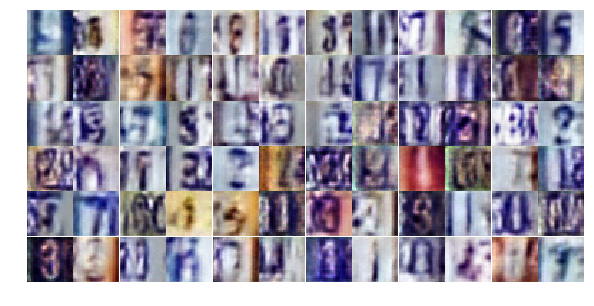

Epoch 5/25... Discriminator Loss: 0.9784... Generator Loss: 0.6818
Epoch 5/25... Discriminator Loss: 0.5508... Generator Loss: 1.2348
Epoch 5/25... Discriminator Loss: 0.6694... Generator Loss: 1.0814
Epoch 5/25... Discriminator Loss: 0.5726... Generator Loss: 1.1396
Epoch 5/25... Discriminator Loss: 1.4642... Generator Loss: 0.3981
Epoch 5/25... Discriminator Loss: 1.1728... Generator Loss: 0.6129
Epoch 6/25... Discriminator Loss: 0.6144... Generator Loss: 1.1183
Epoch 6/25... Discriminator Loss: 0.5052... Generator Loss: 1.4855
Epoch 6/25... Discriminator Loss: 0.6675... Generator Loss: 1.0784
Epoch 6/25... Discriminator Loss: 1.0301... Generator Loss: 0.6367


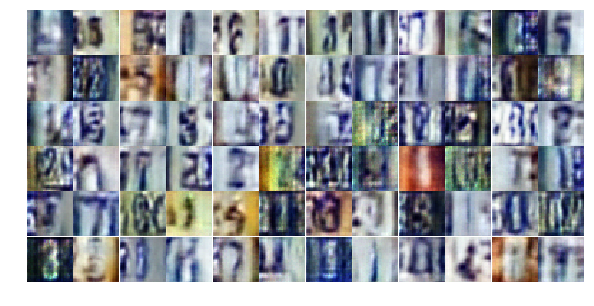

Epoch 6/25... Discriminator Loss: 0.5041... Generator Loss: 1.4691
Epoch 6/25... Discriminator Loss: 0.5578... Generator Loss: 1.4828
Epoch 6/25... Discriminator Loss: 0.7209... Generator Loss: 2.5870
Epoch 6/25... Discriminator Loss: 0.8197... Generator Loss: 1.1912
Epoch 6/25... Discriminator Loss: 0.7170... Generator Loss: 0.9548
Epoch 6/25... Discriminator Loss: 0.5565... Generator Loss: 1.2352
Epoch 6/25... Discriminator Loss: 0.5198... Generator Loss: 1.8067
Epoch 6/25... Discriminator Loss: 1.0624... Generator Loss: 0.5747
Epoch 6/25... Discriminator Loss: 0.6762... Generator Loss: 0.9619
Epoch 6/25... Discriminator Loss: 0.4830... Generator Loss: 1.3788


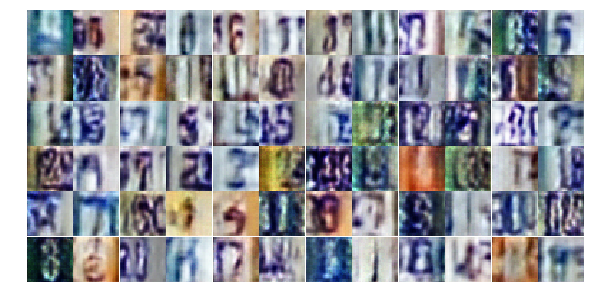

Epoch 6/25... Discriminator Loss: 0.4764... Generator Loss: 1.5971
Epoch 6/25... Discriminator Loss: 0.5953... Generator Loss: 1.4331
Epoch 6/25... Discriminator Loss: 0.8663... Generator Loss: 0.7127
Epoch 6/25... Discriminator Loss: 0.4629... Generator Loss: 1.2733
Epoch 6/25... Discriminator Loss: 0.4189... Generator Loss: 1.9874
Epoch 6/25... Discriminator Loss: 0.5888... Generator Loss: 2.3184
Epoch 6/25... Discriminator Loss: 0.5578... Generator Loss: 1.3741
Epoch 6/25... Discriminator Loss: 0.6778... Generator Loss: 2.1406
Epoch 6/25... Discriminator Loss: 1.2691... Generator Loss: 3.1911
Epoch 6/25... Discriminator Loss: 0.7107... Generator Loss: 1.6203


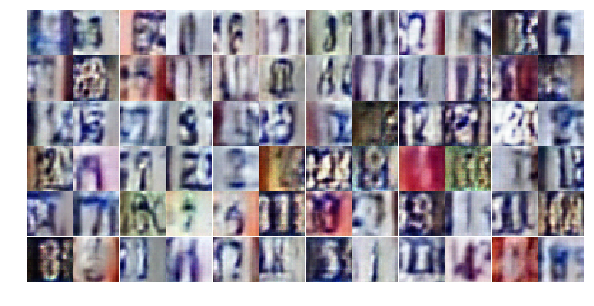

Epoch 6/25... Discriminator Loss: 1.3412... Generator Loss: 0.4558
Epoch 6/25... Discriminator Loss: 1.0929... Generator Loss: 0.6281
Epoch 6/25... Discriminator Loss: 0.7467... Generator Loss: 1.1864
Epoch 6/25... Discriminator Loss: 0.6783... Generator Loss: 0.9336
Epoch 6/25... Discriminator Loss: 0.4877... Generator Loss: 1.6053
Epoch 6/25... Discriminator Loss: 1.0299... Generator Loss: 0.6118
Epoch 6/25... Discriminator Loss: 0.7554... Generator Loss: 0.8458
Epoch 6/25... Discriminator Loss: 0.3383... Generator Loss: 1.6471
Epoch 6/25... Discriminator Loss: 0.5402... Generator Loss: 1.3600
Epoch 6/25... Discriminator Loss: 0.4375... Generator Loss: 1.5403


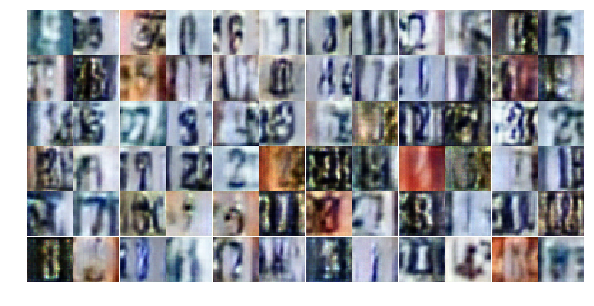

Epoch 6/25... Discriminator Loss: 1.1449... Generator Loss: 2.2230
Epoch 6/25... Discriminator Loss: 0.8116... Generator Loss: 2.8828
Epoch 6/25... Discriminator Loss: 0.5563... Generator Loss: 1.4823
Epoch 6/25... Discriminator Loss: 0.4521... Generator Loss: 1.4934
Epoch 6/25... Discriminator Loss: 0.7285... Generator Loss: 0.9753
Epoch 6/25... Discriminator Loss: 0.7070... Generator Loss: 1.4876
Epoch 6/25... Discriminator Loss: 0.5315... Generator Loss: 2.7825
Epoch 6/25... Discriminator Loss: 0.3624... Generator Loss: 1.8574
Epoch 6/25... Discriminator Loss: 0.5854... Generator Loss: 1.1173
Epoch 6/25... Discriminator Loss: 0.4533... Generator Loss: 1.6018


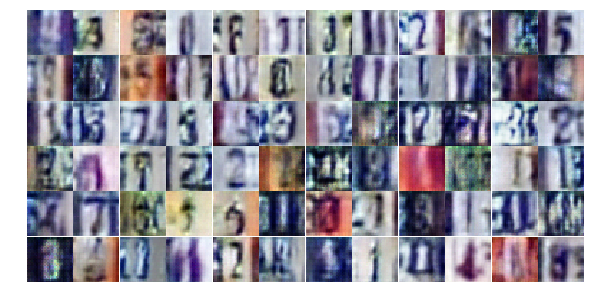

Epoch 6/25... Discriminator Loss: 0.9842... Generator Loss: 1.0012
Epoch 6/25... Discriminator Loss: 0.7202... Generator Loss: 1.2829
Epoch 6/25... Discriminator Loss: 1.2224... Generator Loss: 0.5386
Epoch 6/25... Discriminator Loss: 0.5261... Generator Loss: 1.6939
Epoch 6/25... Discriminator Loss: 0.5892... Generator Loss: 1.8540
Epoch 6/25... Discriminator Loss: 0.6774... Generator Loss: 0.9610
Epoch 6/25... Discriminator Loss: 0.6716... Generator Loss: 1.0736
Epoch 6/25... Discriminator Loss: 1.2471... Generator Loss: 0.4449
Epoch 6/25... Discriminator Loss: 0.5339... Generator Loss: 1.2745
Epoch 6/25... Discriminator Loss: 1.2114... Generator Loss: 0.4562


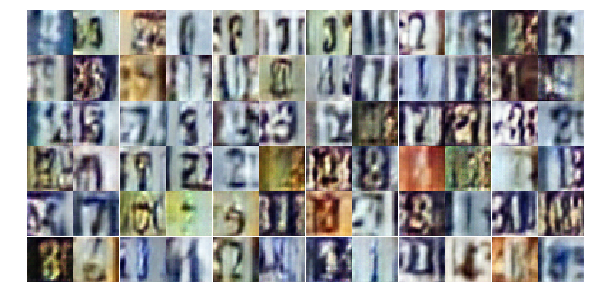

Epoch 6/25... Discriminator Loss: 0.7845... Generator Loss: 0.9075
Epoch 6/25... Discriminator Loss: 0.3877... Generator Loss: 1.7284
Epoch 6/25... Discriminator Loss: 0.4703... Generator Loss: 1.5231
Epoch 7/25... Discriminator Loss: 0.6094... Generator Loss: 1.2146
Epoch 7/25... Discriminator Loss: 0.7460... Generator Loss: 0.9078
Epoch 7/25... Discriminator Loss: 0.5731... Generator Loss: 1.2944
Epoch 7/25... Discriminator Loss: 0.7305... Generator Loss: 0.8775
Epoch 7/25... Discriminator Loss: 0.4158... Generator Loss: 1.6269
Epoch 7/25... Discriminator Loss: 2.1210... Generator Loss: 4.1948
Epoch 7/25... Discriminator Loss: 1.0582... Generator Loss: 0.7261


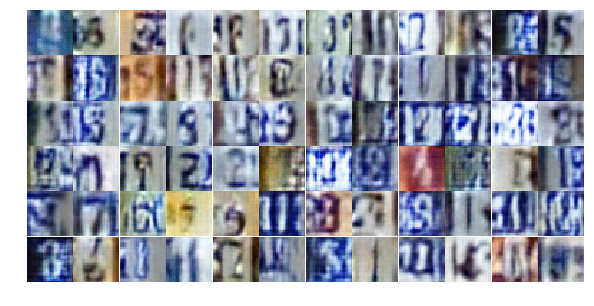

Epoch 7/25... Discriminator Loss: 0.6305... Generator Loss: 1.4369
Epoch 7/25... Discriminator Loss: 0.7333... Generator Loss: 1.3367
Epoch 7/25... Discriminator Loss: 0.6625... Generator Loss: 1.0929
Epoch 7/25... Discriminator Loss: 0.6058... Generator Loss: 1.2190
Epoch 7/25... Discriminator Loss: 0.5605... Generator Loss: 1.1950
Epoch 7/25... Discriminator Loss: 0.5033... Generator Loss: 1.3691
Epoch 7/25... Discriminator Loss: 0.9989... Generator Loss: 2.7592
Epoch 7/25... Discriminator Loss: 1.5931... Generator Loss: 3.2599
Epoch 7/25... Discriminator Loss: 0.6686... Generator Loss: 1.6031
Epoch 7/25... Discriminator Loss: 0.5465... Generator Loss: 1.3597


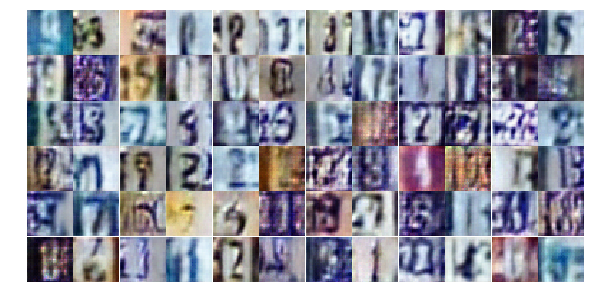

Epoch 7/25... Discriminator Loss: 0.6080... Generator Loss: 1.7204
Epoch 7/25... Discriminator Loss: 0.5069... Generator Loss: 1.4300
Epoch 7/25... Discriminator Loss: 0.5745... Generator Loss: 1.5525
Epoch 7/25... Discriminator Loss: 0.5626... Generator Loss: 1.4653
Epoch 7/25... Discriminator Loss: 0.4201... Generator Loss: 1.7866
Epoch 7/25... Discriminator Loss: 0.4728... Generator Loss: 1.4776
Epoch 7/25... Discriminator Loss: 0.5742... Generator Loss: 1.1742
Epoch 7/25... Discriminator Loss: 1.4075... Generator Loss: 0.3734
Epoch 7/25... Discriminator Loss: 0.5684... Generator Loss: 1.2365
Epoch 7/25... Discriminator Loss: 0.3801... Generator Loss: 2.2562


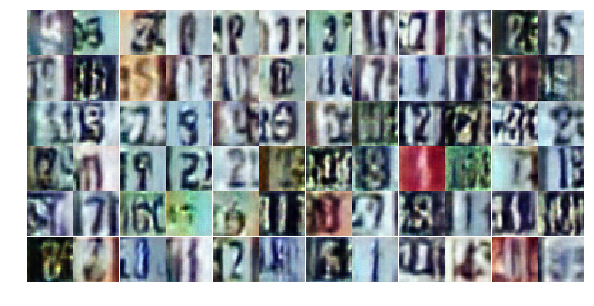

Epoch 7/25... Discriminator Loss: 1.0083... Generator Loss: 0.6014
Epoch 7/25... Discriminator Loss: 0.9332... Generator Loss: 0.6294
Epoch 7/25... Discriminator Loss: 0.4736... Generator Loss: 1.7879
Epoch 7/25... Discriminator Loss: 0.7104... Generator Loss: 0.9022
Epoch 7/25... Discriminator Loss: 0.9293... Generator Loss: 0.7325
Epoch 7/25... Discriminator Loss: 1.0500... Generator Loss: 0.5930
Epoch 7/25... Discriminator Loss: 0.3601... Generator Loss: 1.8082
Epoch 7/25... Discriminator Loss: 0.7202... Generator Loss: 1.0984
Epoch 7/25... Discriminator Loss: 1.2165... Generator Loss: 0.5009
Epoch 7/25... Discriminator Loss: 0.7160... Generator Loss: 3.5992


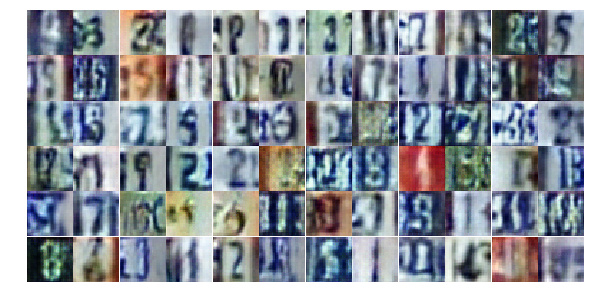

Epoch 7/25... Discriminator Loss: 0.9937... Generator Loss: 0.8603
Epoch 7/25... Discriminator Loss: 0.5010... Generator Loss: 1.4080
Epoch 7/25... Discriminator Loss: 0.4508... Generator Loss: 1.4934
Epoch 7/25... Discriminator Loss: 0.5837... Generator Loss: 1.8306
Epoch 7/25... Discriminator Loss: 0.6758... Generator Loss: 0.9687
Epoch 7/25... Discriminator Loss: 0.4442... Generator Loss: 1.8752
Epoch 7/25... Discriminator Loss: 0.5784... Generator Loss: 1.1242
Epoch 7/25... Discriminator Loss: 0.6935... Generator Loss: 1.6722
Epoch 7/25... Discriminator Loss: 0.4775... Generator Loss: 4.7364
Epoch 7/25... Discriminator Loss: 0.5921... Generator Loss: 1.6741


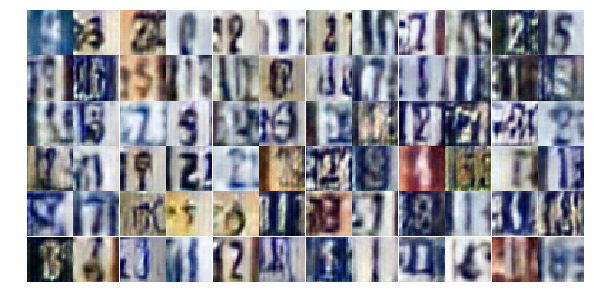

Epoch 7/25... Discriminator Loss: 0.4047... Generator Loss: 1.5183
Epoch 7/25... Discriminator Loss: 0.4083... Generator Loss: 1.5578
Epoch 7/25... Discriminator Loss: 0.5399... Generator Loss: 1.1252
Epoch 7/25... Discriminator Loss: 0.6047... Generator Loss: 2.1490
Epoch 7/25... Discriminator Loss: 0.7367... Generator Loss: 0.9828
Epoch 7/25... Discriminator Loss: 1.0966... Generator Loss: 1.9172
Epoch 7/25... Discriminator Loss: 1.8036... Generator Loss: 0.2432
Epoch 7/25... Discriminator Loss: 0.9705... Generator Loss: 2.5197
Epoch 7/25... Discriminator Loss: 0.7504... Generator Loss: 1.2103
Epoch 7/25... Discriminator Loss: 0.7031... Generator Loss: 0.8527


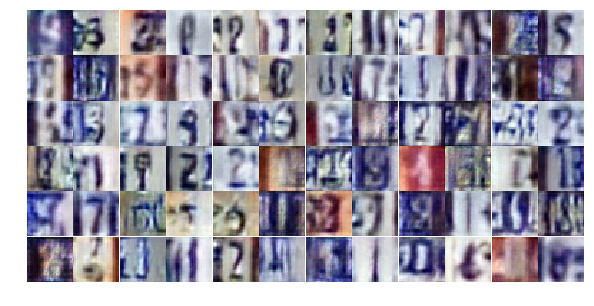

Epoch 7/25... Discriminator Loss: 0.7121... Generator Loss: 2.2101
Epoch 8/25... Discriminator Loss: 0.7815... Generator Loss: 0.8305
Epoch 8/25... Discriminator Loss: 0.8760... Generator Loss: 0.7228
Epoch 8/25... Discriminator Loss: 0.6176... Generator Loss: 1.2395
Epoch 8/25... Discriminator Loss: 0.5176... Generator Loss: 1.4327
Epoch 8/25... Discriminator Loss: 1.0849... Generator Loss: 0.5609
Epoch 8/25... Discriminator Loss: 0.6283... Generator Loss: 1.3086
Epoch 8/25... Discriminator Loss: 0.5545... Generator Loss: 1.3432


In [0]:
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [0]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

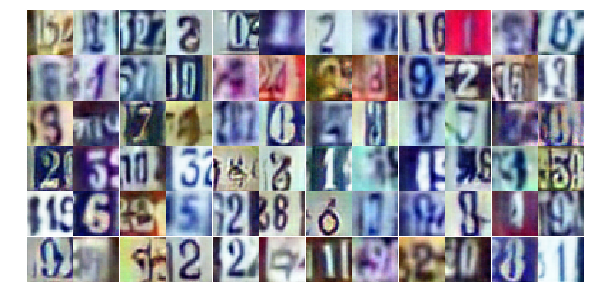

In [0]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))